# Advanced Regression - Housing prices in Australian market

### Problem Statement:

A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses data analytics to purchase houses at a price below their actual values and flip them on at a higher price

 

The company is looking at prospective properties to buy to enter the market. You are required to build a regression model using regularisation in order to predict the actual value of the prospective properties and decide whether to invest in them or not.

 

The company wants to know:
- **Which variables are significant in predicting the price of a house**.
- **How well those variables describe the price of a house**.



Also, determine the optimal value of lambda for ridge and lasso regression. 

### Business Goal

You are required to model the price of houses with the available independent variables. This model will then be used by the management to understand how exactly the prices vary with the variables. They can accordingly manipulate the strategy of the firm and concentrate on areas that will yield high returns. Further, the model will be a good way for management to understand the pricing dynamics of a new market.

In [85]:
# import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import linear_model
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.model_selection import KFold
# hide warnings
import warnings
warnings.filterwarnings('ignore')

In [86]:
## import Data
housing_df = pd.read_csv("train.csv")
housing_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


### Data peek

In [87]:
##import data info
housing_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [88]:
## checking for outlier
housing_df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


#### Insights
- outliers observed `LotFrontage`, `LotArea`,`PoolArea`,`MiscVal`

In [89]:
# removing outliers
outlier_cols = ['LotFrontage','LotArea','PoolArea','MiscVal']
for out_col in outlier_cols:
    Q1 = housing_df[out_col].quantile(0.25)
    Q3 = housing_df[out_col].quantile(0.75)
    IQR = Q3 - Q1
    housing_df = housing_df[(housing_df[out_col] >= Q1 - 1.5*IQR) & (housing_df[out_col] <= Q3 + 1.5*IQR)]
housing_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


### Data sanitization

In [90]:
# check for na values
nulls_na_count = housing_df.loc[:, housing_df.isnull().any()].isnull().sum();
nulls_na_count

Alley            963
MasVnrType         6
MasVnrArea         6
BsmtQual          27
BsmtCond          27
BsmtExposure      28
BsmtFinType1      27
BsmtFinType2      28
Electrical         1
FireplaceQu      526
GarageType        62
GarageYrBlt       62
GarageFinish      62
GarageQual        62
GarageCond        62
PoolQC          1038
Fence            843
MiscFeature     1036
dtype: int64

In [91]:
#percentage of null values
percentage_of_na_null_count = (nulls_na_count/len(housing_df))*100
percentage_of_na_null_count

Alley            92.774566
MasVnrType        0.578035
MasVnrArea        0.578035
BsmtQual          2.601156
BsmtCond          2.601156
BsmtExposure      2.697495
BsmtFinType1      2.601156
BsmtFinType2      2.697495
Electrical        0.096339
FireplaceQu      50.674374
GarageType        5.973025
GarageYrBlt       5.973025
GarageFinish      5.973025
GarageQual        5.973025
GarageCond        5.973025
PoolQC          100.000000
Fence            81.213873
MiscFeature      99.807322
dtype: float64

#### Insights
- Alley, PoolQC, Fence and MiscFeature has most null or na values in data

In [92]:
#fixing na values columns observed


housing_df.loc[housing_df['Alley'].isnull(),['Alley']] = 'No alley access'

housing_df.loc[housing_df['LotFrontage'].isnull(),['LotFrontage']] = housing_df['LotFrontage'].mean()

housing_df.loc[housing_df['MasVnrType'].isnull(),['MasVnrType']] = 'none'
# based on data dictionary MasVnrType type is 'none' area will 0
housing_df.loc[housing_df['MasVnrArea'].isnull(),['MasVnrArea']] = 0
# based on data dictionary na in BsmtQual, BsmtCond, BsmtExposure, BsmtFinType1, BsmtFinType2 means ''No Basement'
housing_df.loc[housing_df['BsmtQual'].isnull(),['BsmtQual']] = 'No Basement'
housing_df.loc[housing_df['BsmtCond'].isnull(),['BsmtCond']] = 'No Basement'
housing_df.loc[housing_df['BsmtExposure'].isnull(),['BsmtExposure']] = "No Basement"
housing_df.loc[housing_df['BsmtFinType1'].isnull(),['BsmtFinType1']] = 'No Basement'
housing_df.loc[housing_df['BsmtFinType2'].isnull(),['BsmtFinType2']] = 'No Basement'
# based on data dictionary na in FireplaceQu means 'No Fireplace'
housing_df.loc[housing_df['FireplaceQu'].isnull(),['FireplaceQu']] = 'No Fireplace'
# based on data dictionary na in GarageType,GarageFinish,GarageQual,GarageCond means 'No Garage'
housing_df.loc[housing_df['GarageType'].isnull(),['GarageType']] = 'No Garage'
housing_df.loc[housing_df['GarageFinish'].isnull(),['GarageFinish']] = 'No Garage'
housing_df.loc[housing_df['GarageQual'].isnull(),['GarageQual']] = 'No Garage'
housing_df.loc[housing_df['GarageCond'].isnull(),['GarageCond']] = 'No Garage'
# based on data dictionary na in PoolQC means 'No Pool'
housing_df.loc[housing_df['PoolQC'].isnull(),['PoolQC']] = 'No Pool'
# based on data dictionary na in Fence means 'No Fence'
housing_df.loc[housing_df['Fence'].isnull(),['Fence']] = 'No Fence'
# based on data dictionary na in MiscFeature means 'none'
housing_df.loc[housing_df['MiscFeature'].isnull(),['MiscFeature']] = 'none'
# impute GarageYrBlt with 2019 so that while calculating age it will it will turn to 0
# age = 2019-2019 = 0
housing_df.loc[housing_df['GarageYrBlt'].isnull(),['GarageYrBlt']] = 2019
# impute electrical column with SBrkr as it is the most occuring value
housing_df.loc[housing_df['Electrical'].isnull(),['Electrical']] = "SBrkr"

In [93]:
#checking for nulls and na
nulls_na_count = housing_df.loc[:, housing_df.isnull().any()].isnull().sum();
nulls_na_count

Series([], dtype: float64)

In [94]:
## drop duplicates
housing_df = housing_df.drop_duplicates()
housing_df.shape

(1038, 81)

In [95]:
## drop id as we removed the duplicates and no 
housing_df = housing_df.drop(['Id'], axis=1)
housing_df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,No alley access,Reg,Lvl,AllPub,Inside,...,0,No Pool,No Fence,none,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,No alley access,Reg,Lvl,AllPub,FR2,...,0,No Pool,No Fence,none,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,No alley access,IR1,Lvl,AllPub,Inside,...,0,No Pool,No Fence,none,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,No alley access,IR1,Lvl,AllPub,Corner,...,0,No Pool,No Fence,none,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,No alley access,IR1,Lvl,AllPub,FR2,...,0,No Pool,No Fence,none,0,12,2008,WD,Normal,250000


#### Insights
- removed duplicates
- dropped Id as it not required variable housing price

In [96]:
category_cols = ['MSZoning','Street','Alley','LotShape','LandContour',
                 'Utilities','LotConfig','LandSlope','Neighborhood',
                 'Condition1','Condition2','BldgType','HouseStyle',
                 'RoofStyle','RoofMatl','Exterior1st','Exterior2nd',
                 'MasVnrType','ExterQual','ExterCond','Foundation','BsmtQual',
                 'BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2','Heating',
                 'HeatingQC','CentralAir','Electrical','KitchenQual','Functional',
                 'FireplaceQu','GarageType','GarageFinish','GarageQual','GarageCond',
                'PoolQC','Fence','MiscFeature','SaleType','SaleCondition']

In [97]:
for col in category_cols:
    housing_df[col].astype('category')

In [98]:
housing_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1038 entries, 0 to 1459
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1038 non-null   int64  
 1   MSZoning       1038 non-null   object 
 2   LotFrontage    1038 non-null   float64
 3   LotArea        1038 non-null   int64  
 4   Street         1038 non-null   object 
 5   Alley          1038 non-null   object 
 6   LotShape       1038 non-null   object 
 7   LandContour    1038 non-null   object 
 8   Utilities      1038 non-null   object 
 9   LotConfig      1038 non-null   object 
 10  LandSlope      1038 non-null   object 
 11  Neighborhood   1038 non-null   object 
 12  Condition1     1038 non-null   object 
 13  Condition2     1038 non-null   object 
 14  BldgType       1038 non-null   object 
 15  HouseStyle     1038 non-null   object 
 16  OverallQual    1038 non-null   int64  
 17  OverallCond    1038 non-null   int64  
 18  YearBuil

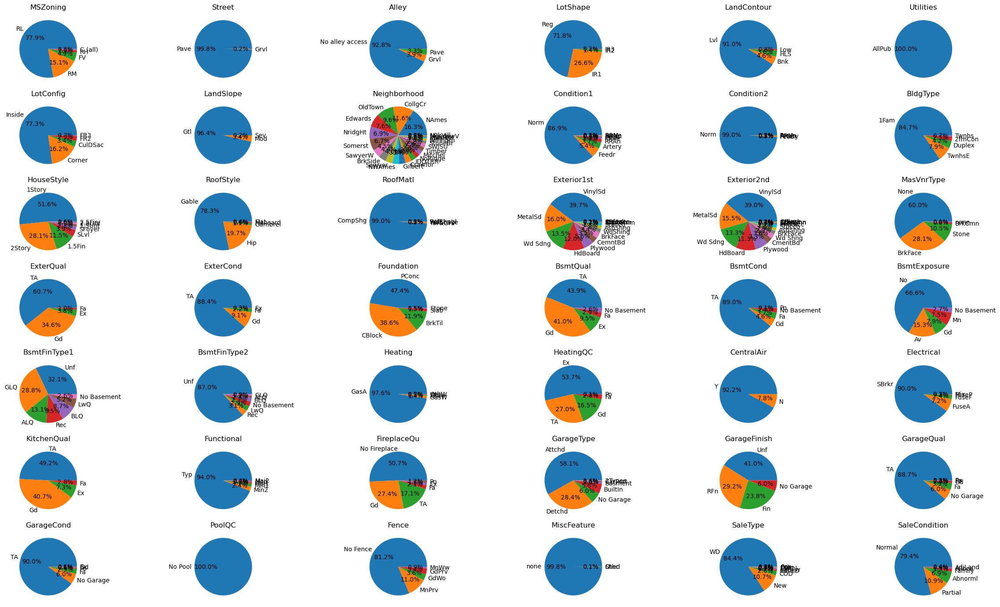

In [99]:
plt.figure(figsize=(30, 20))
for idx, col in enumerate(category_cols):
    plt.subplot(8,6,idx+1)
    plt.gca().set_title(col)
    pie_data = housing_df[col].value_counts()
    plt.pie(pie_data,labels=pie_data.index, autopct='%.1f%%')

#### Insighs
- `Street`,`Utilities`,`LotFrontage`,`Alley`,`FireplaceQu`,`PoolQC`,`Fence`,`MiscFeature` has very less data 

In [100]:
#removing columns with less data

housing_df = housing_df.drop(['Street','Utilities','LotFrontage','Alley','FireplaceQu','PoolQC','Fence','MiscFeature'], axis=1)

### Checking correlation

In [101]:
housing_df_corr = housing_df.select_dtypes(include=['float64', 'int64'])
housing_df_corr.head()

,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,60,8450,7,5,2003,2003,196.0,706,0,150,...,0,61,0,0,0,0,0,2,2008,208500
1,20,9600,6,8,1976,1976,0.0,978,0,284,...,298,0,0,0,0,0,0,5,2007,181500
2,60,11250,7,5,2001,2002,162.0,486,0,434,...,0,42,0,0,0,0,0,9,2008,223500
3,70,9550,7,5,1915,1970,0.0,216,0,540,...,0,35,272,0,0,0,0,2,2006,140000
4,60,14260,8,5,2000,2000,350.0,655,0,490,...,192,84,0,0,0,0,0,12,2008,250000


In [102]:
# correlation matrix
cor_matrix = housing_df_corr.corr()
cor_matrix

,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
MSSubClass,1.000000,-0.289069,0.043137,-0.068626,-0.026337,0.028404,-0.003848,-0.047553,-0.072888,-0.115370,...,-0.001470,0.063395,0.018612,-0.036521,0.002212,NaN,NaN,-0.027430,-0.023803,-0.040252
LotArea,-0.289069,1.000000,0.302551,-0.099051,0.187907,0.119112,0.244648,0.173764,0.045498,0.128133,...,0.186327,0.118319,-0.090151,0.039043,0.092520,NaN,NaN,0.028100,-0.015742,0.454655
OverallQual,0.043137,0.302551,1.000000,-0.157343,0.617628,0.564427,0.407454,0.224040,-0.055915,0.328027,...,0.291448,0.337017,-0.193512,0.032469,0.076258,NaN,NaN,0.092124,0.002612,0.826701
OverallCond,-0.068626,-0.099051,-0.157343,1.000000,-0.396399,0.050685,-0.159810,-0.056368,0.053058,-0.165327,...,-0.014898,-0.075579,0.095178,0.009477,0.058468,NaN,NaN,-0.020569,0.038989,-0.160780
YearBuilt,-0.026337,0.187907,0.617628,-0.396399,1.000000,0.607902,0.343824,0.269318,-0.035012,0.186078,...,0.254937,0.233414,-0.444086,0.025843,-0.002615,NaN,NaN,0.030388,-0.004232,0.612992
YearRemodAdd,0.028404,0.119112,0.564427,0.050685,0.607902,1.000000,0.194042,0.131907,-0.054458,0.194819,...,0.241995,0.268567,-0.221061,0.027801,-0.002271,NaN,NaN,0.034604,0.047648,0.557262
MasVnrArea,-0.003848,0.244648,0.407454,-0.159810,0.343824,0.194042,1.000000,0.248328,-0.066933,0.132904,...,0.181865,0.120810,-0.148249,0.028269,0.091862,NaN,NaN,0.039896,-0.000495,0.499461
BsmtFinSF1,-0.047553,0.173764,0.224040,-0.056368,0.269318,0.131907,0.248328,1.000000,-0.036128,-0.535179,...,0.214452,0.062986,-0.157810,0.022916,0.081185,NaN,NaN,0.006874,0.009863,0.387769
BsmtFinSF2,-0.072888,0.045498,-0.055915,0.053058,-0.035012,-0.054458,-0.066933,-0.036128,1.000000,-0.211121,...,0.057217,-0.012077,0.034958,-0.027621,0.042291,NaN,NaN,-0.035388,0.036980,-0.029462
BsmtUnfSF,-0.115370,0.128133,0.328027,-0.165327,0.186078,0.194819,0.132904,-0.535179,-0.211121,1.000000,...,0.004295,0.141143,-0.038141,0.026798,-0.016999,NaN,NaN,0.050817,-0.006397,0.242333


#### insights
- very less inference details need to draw heatmap and pairplot

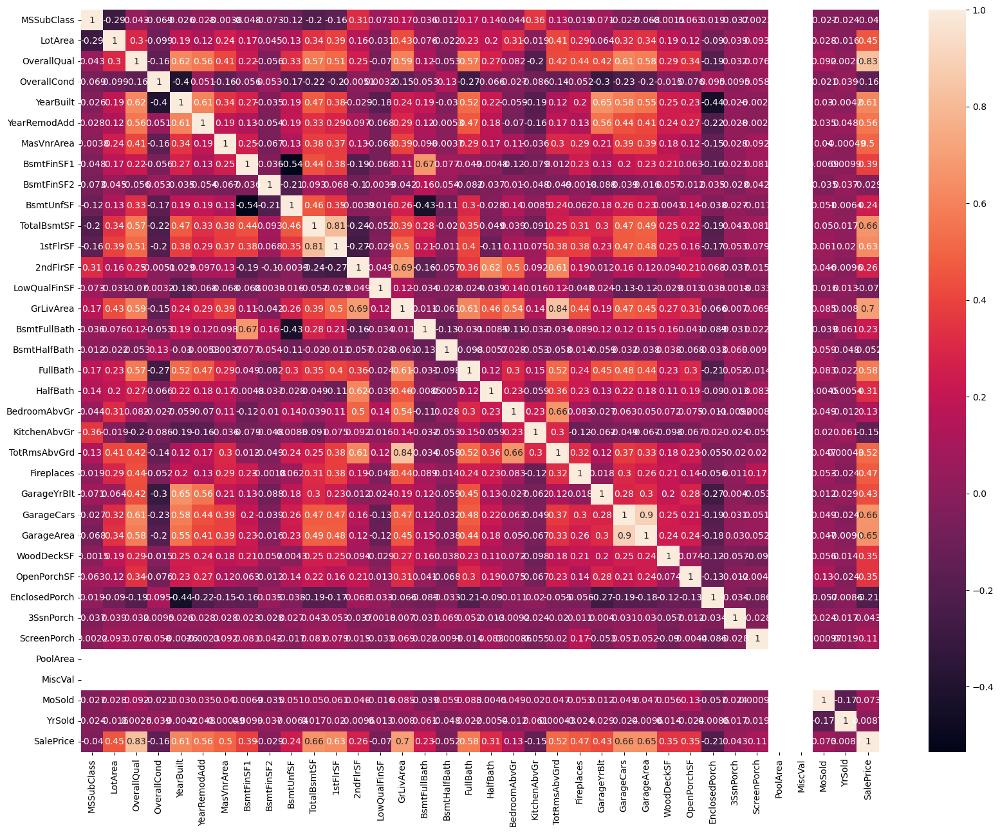

In [103]:
plt.figure(figsize = (20, 15))
# heatmap
sns.heatmap(cor_matrix, annot=True)
plt.show()

In [104]:
# calculate house age = 2019 - year build
housing_df["house_age"] = 2019 - housing_df["YearBuilt"]
# calculate house age when sold in month as we have month and year both for sold house
housing_df["house_age_in_months_sold"] = (((housing_df["YrSold"]-1) - housing_df["YearBuilt"])*12) + housing_df["MoSold"]
# calculate garage age = 2019 - year build
housing_df["garage_age"] = 2019 - housing_df["GarageYrBlt"]
# calculate gap b/w house build and remodel = YearRemodAdd - year build
housing_df["gap_between_build_remodel"] = housing_df["YearRemodAdd"] - housing_df["YearBuilt"]

In [137]:
# paiwise scatter plot for all numeric columns
sns.pairplot(housing_df_corr)
plt.show()

In [105]:
# from above heat map removing the columns has high correlation
housing_df = housing_df.drop(['GarageYrBlt','YearBuilt','YrSold',
                                              'YearRemodAdd','MoSold','BsmtFullBath',
                                              'BsmtHalfBath','FullBath','HalfBath',
                                              'BedroomAbvGr','KitchenAbvGr','TotRmsAbvGrd',
                                              'OverallQual','GarageCars','OverallCond',
                                              'Fireplaces'], axis=1)

In [106]:
housing_df.shape

(1038, 60)

## Data preparation for model building

In [107]:
# split into X and y
X = housing_df.drop(['SalePrice'], axis=1)

# using log on y i.e sales price as we are getting high value coffiencts at end
housing_df['SalePrice'] = np.log(housing_df['SalePrice'])
y = housing_df['SalePrice']

In [108]:
X.head()

,MSSubClass,MSZoning,LotArea,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,3SsnPorch,ScreenPorch,PoolArea,MiscVal,SaleType,SaleCondition,house_age,house_age_in_months_sold,garage_age,gap_between_build_remodel
0,60,RL,8450,Reg,Lvl,Inside,Gtl,CollgCr,Norm,Norm,...,0,0,0,0,WD,Normal,16,50,16.0,0
1,20,RL,9600,Reg,Lvl,FR2,Gtl,Veenker,Feedr,Norm,...,0,0,0,0,WD,Normal,43,365,43.0,0
2,60,RL,11250,IR1,Lvl,Inside,Gtl,CollgCr,Norm,Norm,...,0,0,0,0,WD,Normal,18,81,18.0,1
3,70,RL,9550,IR1,Lvl,Corner,Gtl,Crawfor,Norm,Norm,...,0,0,0,0,WD,Abnorml,104,1082,21.0,55
4,60,RL,14260,IR1,Lvl,FR2,Gtl,NoRidge,Norm,Norm,...,0,0,0,0,WD,Normal,19,96,19.0,0


In [109]:
# creating dummy variables for yes/no categorical variables

yes_or_no_list =  ['CentralAir']

# defining the map function
def binary_map(x):
    return x.map({'Y': 1, "N": 0})

# applying the function to column with yes /no data
X[yes_or_no_list] = X[yes_or_no_list].apply(binary_map)
X.head()

,MSSubClass,MSZoning,LotArea,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,3SsnPorch,ScreenPorch,PoolArea,MiscVal,SaleType,SaleCondition,house_age,house_age_in_months_sold,garage_age,gap_between_build_remodel
0,60,RL,8450,Reg,Lvl,Inside,Gtl,CollgCr,Norm,Norm,...,0,0,0,0,WD,Normal,16,50,16.0,0
1,20,RL,9600,Reg,Lvl,FR2,Gtl,Veenker,Feedr,Norm,...,0,0,0,0,WD,Normal,43,365,43.0,0
2,60,RL,11250,IR1,Lvl,Inside,Gtl,CollgCr,Norm,Norm,...,0,0,0,0,WD,Normal,18,81,18.0,1
3,70,RL,9550,IR1,Lvl,Corner,Gtl,Crawfor,Norm,Norm,...,0,0,0,0,WD,Abnorml,104,1082,21.0,55
4,60,RL,14260,IR1,Lvl,FR2,Gtl,NoRidge,Norm,Norm,...,0,0,0,0,WD,Normal,19,96,19.0,0


In [110]:
#select dummies in to dataframe
housing_df_categorical = X.select_dtypes(include=['object'])
housing_df_categorical.head()

,MSZoning,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,...,Electrical,KitchenQual,Functional,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
0,RL,Reg,Lvl,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,...,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
1,RL,Reg,Lvl,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,...,SBrkr,TA,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
2,RL,IR1,Lvl,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,...,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
3,RL,IR1,Lvl,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,...,SBrkr,Gd,Typ,Detchd,Unf,TA,TA,Y,WD,Abnorml
4,RL,IR1,Lvl,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,...,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal


In [111]:
# convert categorical variables into dummies
housing_df_dummies = pd.get_dummies(housing_df_categorical, drop_first=True)
housing_df_dummies.head()

,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,0,0,1,0,0,0,1,0,0,1,...,0,0,0,0,1,0,0,0,1,0
1,0,0,1,0,0,0,1,0,0,1,...,0,0,0,0,1,0,0,0,1,0
2,0,0,1,0,0,0,0,0,0,1,...,0,0,0,0,1,0,0,0,1,0
3,0,0,1,0,0,0,0,0,0,1,...,0,0,0,0,1,0,0,0,0,0
4,0,0,1,0,0,0,0,0,0,1,...,0,0,0,0,1,0,0,0,1,0


In [112]:
# drop original categorical variables after creating dummies
X = X.drop(list(housing_df_categorical.columns), axis=1)
# concat dummy variables with X
X = pd.concat([X, housing_df_dummies], axis=1)

In [113]:
X.head()

,MSSubClass,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,CentralAir,1stFlrSF,2ndFlrSF,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,60,8450,196.0,706,0,150,856,1,856,854,...,0,0,0,0,1,0,0,0,1,0
1,20,9600,0.0,978,0,284,1262,1,1262,0,...,0,0,0,0,1,0,0,0,1,0
2,60,11250,162.0,486,0,434,920,1,920,866,...,0,0,0,0,1,0,0,0,1,0
3,70,9550,0.0,216,0,540,756,1,961,756,...,0,0,0,0,1,0,0,0,0,0
4,60,14260,350.0,655,0,490,1145,1,1145,1053,...,0,0,0,0,1,0,0,0,1,0


#### Minmaxscalling

In [114]:
# Scale data 
scaler = MinMaxScaler()

scale_var = X.columns
X[scale_var] = scaler.fit_transform(X[scale_var])

In [115]:
X.head()

,MSSubClass,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,CentralAir,1stFlrSF,2ndFlrSF,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,0.235294,0.432639,0.12250,0.322669,0.0,0.064212,0.266999,1.0,0.238356,0.530106,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
1,0.000000,0.515534,0.00000,0.446984,0.0,0.121575,0.393637,1.0,0.423744,0.000000,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
2,0.235294,0.634470,0.10125,0.222121,0.0,0.185788,0.286962,1.0,0.267580,0.537554,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
3,0.294118,0.511930,0.00000,0.098720,0.0,0.231164,0.235808,1.0,0.286301,0.469274,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,0.235294,0.851438,0.21875,0.299360,0.0,0.209760,0.357143,1.0,0.370320,0.653631,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0


### Model Building

In [116]:
# split data into test and train
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7,
                                                    test_size = 0.3, 
                                                    random_state = 1, shuffle= True)

In [117]:
# linear regression
lm = LinearRegression()
lm.fit(X_train, y_train)

# predict
y_train_pred = lm.predict(X_train)
metrics.r2_score(y_true=y_train, y_pred=y_train_pred)

0.9479580196011416

In [118]:
y_test_pred = lm.predict(X_test)
metrics.r2_score(y_true=y_test, y_pred=y_test_pred)

-4.947406365227683e+19

In [119]:
# model coefficients
model_parameters = list(lm.coef_)
model_parameters.insert(0, lm.intercept_)
model_parameters = [round(x, 3) for x in model_parameters]
cols = X.columns
cols = cols.insert(0, "constant")

list(zip(cols, model_parameters))

[('constant', 10.448),
 ('MSSubClass', -0.042),
 ('LotArea', 0.125),
 ('MasVnrArea', 0.001),
 ('BsmtFinSF1', -110802448906.954),
 ('BsmtFinSF2', -74644794190.53),
 ('BsmtUnfSF', -118297312909.934),
 ('TotalBsmtSF', 162354959413.55),
 ('CentralAir', 0.082),
 ('1stFlrSF', 460760786886.826),
 ('2ndFlrSF', 338943208983.849),
 ('LowQualFinSF', 108352422487.119),
 ('GrLivArea', -644013136373.716),
 ('GarageArea', 0.197),
 ('WoodDeckSF', 0.062),
 ('OpenPorchSF', 0.029),
 ('EnclosedPorch', -0.003),
 ('3SsnPorch', 0.075),
 ('ScreenPorch', 0.084),
 ('PoolArea', 309775271560.081),
 ('MiscVal', -14401112726.805),
 ('house_age', 0.237),
 ('house_age_in_months_sold', -0.741),
 ('garage_age', 0.039),
 ('gap_between_build_remodel', 0.215),
 ('MSZoning_FV', 0.559),
 ('MSZoning_RH', 0.423),
 ('MSZoning_RL', 0.433),
 ('MSZoning_RM', 0.378),
 ('LotShape_IR2', -0.013),
 ('LotShape_IR3', -0.052),
 ('LotShape_Reg', 0.007),
 ('LandContour_HLS', 0.01),
 ('LandContour_Low', -0.136),
 ('LandContour_Lvl', -0.032)

#### Insight

- It's clearly visible that this model is overfitting and accuracy is very poor on test data set.

### Lasso regression

In [120]:
# lasso regression without tuning hyper parameter
lm = Lasso(alpha=0.001)
lm.fit(X_train, y_train)

# predict
y_train_pred = lm.predict(X_train)
print(metrics.r2_score(y_true=y_train, y_pred=y_train_pred))
y_test_pred = lm.predict(X_test)
print(metrics.r2_score(y_true=y_test, y_pred=y_test_pred))

0.9204614428097466
0.8849777730328634


In [121]:
# lasso model parameters without tuning hyper parameter
model_parameters = list(lm.coef_)
model_parameters.insert(0, lm.intercept_)
model_parameters = [round(x, 3) for x in model_parameters]
cols = X.columns
cols = cols.insert(0, "constant")
list(zip(cols, model_parameters))

[('constant', 11.194),
 ('MSSubClass', -0.015),
 ('LotArea', 0.158),
 ('MasVnrArea', 0.0),
 ('BsmtFinSF1', 0.136),
 ('BsmtFinSF2', 0.0),
 ('BsmtUnfSF', 0.0),
 ('TotalBsmtSF', 0.274),
 ('CentralAir', 0.07),
 ('1stFlrSF', 0.08),
 ('2ndFlrSF', 0.0),
 ('LowQualFinSF', -0.0),
 ('GrLivArea', 0.929),
 ('GarageArea', 0.163),
 ('WoodDeckSF', 0.022),
 ('OpenPorchSF', 0.001),
 ('EnclosedPorch', 0.0),
 ('3SsnPorch', 0.0),
 ('ScreenPorch', 0.053),
 ('PoolArea', 0.0),
 ('MiscVal', 0.0),
 ('house_age', -0.0),
 ('house_age_in_months_sold', -0.351),
 ('garage_age', -0.0),
 ('gap_between_build_remodel', 0.139),
 ('MSZoning_FV', 0.106),
 ('MSZoning_RH', -0.0),
 ('MSZoning_RL', 0.036),
 ('MSZoning_RM', 0.0),
 ('LotShape_IR2', 0.0),
 ('LotShape_IR3', -0.0),
 ('LotShape_Reg', -0.002),
 ('LandContour_HLS', 0.0),
 ('LandContour_Low', -0.041),
 ('LandContour_Lvl', 0.0),
 ('LotConfig_CulDSac', 0.027),
 ('LotConfig_FR2', -0.0),
 ('LotConfig_FR3', -0.0),
 ('LotConfig_Inside', -0.0),
 ('LandSlope_Mod', -0.0),
 ('L

#### Insights
- Model good accuracy on test but there is difference of 8% between train and test data

let's tune the hyper paramter to get optimum model

In [122]:
folds = KFold(n_splits = 5, shuffle = True, random_state = 4)

# specify range of hyperparameters
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 200]}

# grid search
# lasso model
model = Lasso()
model_cv = GridSearchCV(estimator = model, param_grid = params, 
                        scoring= 'r2', 
                        cv = folds, 
                        return_train_score=True, verbose = 1)            
model_cv.fit(X_train, y_train) 

Fitting 5 folds for each of 27 candidates, totalling 135 fits


GridSearchCV(cv=KFold(n_splits=5, random_state=4, shuffle=True),
             estimator=Lasso(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 200]},
             return_train_score=True, scoring='r2', verbose=1)

In [123]:
# results data frame 
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.077121,0.004446,0.003775,0.003140,0.0001,{'alpha': 0.0001},0.906447,0.865817,0.885260,0.863249,...,0.885986,0.019391,2,0.947446,0.955928,0.950266,0.948141,0.946521,0.949660,0.003368
1,0.017069,0.004486,0.007492,0.007168,0.001,{'alpha': 0.001},0.903648,0.902098,0.888332,0.864527,...,0.895488,0.018249,1,0.922860,0.921874,0.925245,0.928031,0.919183,0.923439,0.003008
2,0.005034,0.002754,0.002852,0.002941,0.01,{'alpha': 0.01},0.822031,0.757188,0.786481,0.766347,...,0.788475,0.024804,3,0.803218,0.798547,0.815891,0.819062,0.806248,0.808593,0.007722
3,0.005948,0.001776,0.002559,0.001964,0.05,{'alpha': 0.05},0.441369,0.375714,0.431582,0.418465,...,0.419568,0.023101,4,0.421558,0.434974,0.432997,0.431922,0.422416,0.428773,0.005633
4,0.006770,0.006614,0.002843,0.005425,0.1,{'alpha': 0.1},0.148231,0.128081,0.163246,0.158299,...,0.152213,0.013251,5,0.146712,0.160672,0.159920,0.163625,0.160493,0.158285,0.005928


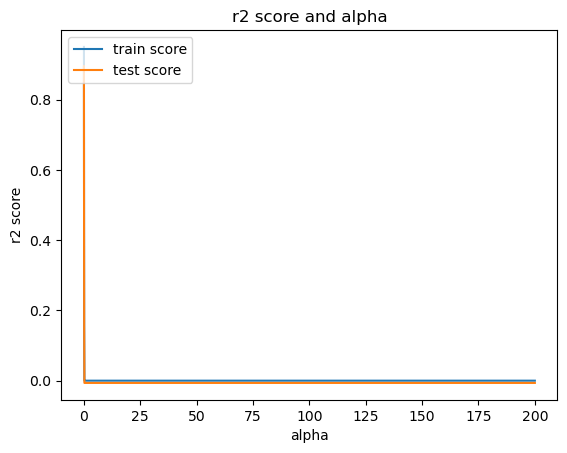

In [124]:
# plot to choose optimal value of aplha / hyper parameter
cv_results['param_alpha'] = cv_results['param_alpha'].astype('float32')
plt.plot(cv_results['param_alpha'], cv_results['mean_train_score'])
plt.plot(cv_results['param_alpha'], cv_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('r2 score')
plt.title("r2 score and alpha")
plt.legend(['train score', 'test score'], loc='upper left')
plt.show()

 #### Insights
 optimal value for alpha is lessthan 1. So let's use this value of alpha for regularization

In [125]:
# model with optimal alpha = 0.01
# lasso regression
lm = Lasso(alpha=0.01)
lm.fit(X_train, y_train)


# predict
y_train_pred = lm.predict(X_train)
print(metrics.r2_score(y_true=y_train, y_pred=y_train_pred))
y_test_pred = lm.predict(X_test)
print(metrics.r2_score(y_true=y_test, y_pred=y_test_pred))

0.8076368689171186
0.7778901764180544


In [126]:
# model with optimal alpha = 0.0001
# lasso regression
lm = Lasso(alpha=0.0001)
lm.fit(X_train, y_train)


# predict
y_train_pred = lm.predict(X_train)
print(metrics.r2_score(y_true=y_train, y_pred=y_train_pred))
y_test_pred = lm.predict(X_test)
print(metrics.r2_score(y_true=y_test, y_pred=y_test_pred))

0.9439879231554645
0.8965367999723738


In [127]:
# lasso model parameters with alpha = 60
model_parameters = list(lm.coef_)
model_parameters.insert(0, lm.intercept_)
model_parameters = [round(x, 3) for x in model_parameters]
cols = X.columns
cols = cols.insert(0, "constant")
lasso_cof = lm.coef_
lasso_cofficents = list(zip(cols, model_parameters))
lasso_cofficents

[('constant', 10.958),
 ('MSSubClass', -0.034),
 ('LotArea', 0.144),
 ('MasVnrArea', -0.0),
 ('BsmtFinSF1', 0.136),
 ('BsmtFinSF2', 0.05),
 ('BsmtUnfSF', -0.0),
 ('TotalBsmtSF', 0.292),
 ('CentralAir', 0.067),
 ('1stFlrSF', 0.069),
 ('2ndFlrSF', 0.0),
 ('LowQualFinSF', -0.0),
 ('GrLivArea', 0.904),
 ('GarageArea', 0.176),
 ('WoodDeckSF', 0.063),
 ('OpenPorchSF', 0.031),
 ('EnclosedPorch', 0.007),
 ('3SsnPorch', 0.057),
 ('ScreenPorch', 0.085),
 ('PoolArea', 0.0),
 ('MiscVal', 0.0),
 ('house_age', -0.0),
 ('house_age_in_months_sold', -0.479),
 ('garage_age', 0.024),
 ('gap_between_build_remodel', 0.227),
 ('MSZoning_FV', 0.399),
 ('MSZoning_RH', 0.259),
 ('MSZoning_RL', 0.305),
 ('MSZoning_RM', 0.271),
 ('LotShape_IR2', -0.0),
 ('LotShape_IR3', -0.071),
 ('LotShape_Reg', 0.008),
 ('LandContour_HLS', 0.009),
 ('LandContour_Low', -0.133),
 ('LandContour_Lvl', -0.016),
 ('LotConfig_CulDSac', 0.026),
 ('LotConfig_FR2', -0.034),
 ('LotConfig_FR3', -0.0),
 ('LotConfig_Inside', -0.001),
 ('Lan

#### Insights
- With optimal value of `alpha` = 0.0001, we got following score for train and test data set.

- R2 for train : 0.9439879231554645
- R2 for test : 0.8965367999723738

**we can conclude that model is not overfitting as train and test data r2 is very less in change**

### Ridge Regression

Let's start same normalization with ridge regression

In [128]:
# ridge regression without tuning hyper parameter
lm = Ridge(alpha=0.001)
lm.fit(X_train, y_train)

# predict
y_train_pred = lm.predict(X_train)
print(metrics.r2_score(y_true=y_train, y_pred=y_train_pred))
y_test_pred = lm.predict(X_test)
print(metrics.r2_score(y_true=y_test, y_pred=y_test_pred))

0.9479564354435255
0.8773206003572729


#### Insights 
- As we see R2 score is simiar to lasso and there is difference of 9 percent

let's tune the hyper paramter to get optimum model

In [129]:
params = {'alpha': [0.001, 0.01, 1.0, 5.0, 10.0]}

ridge = Ridge()

# cross validation
folds = 5
model_cv = GridSearchCV(estimator = ridge, 
                        param_grid = params, 
                        scoring= 'r2', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            
model_cv.fit(X_train, y_train) 

Fitting 5 folds for each of 5 candidates, totalling 25 fits


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.001, 0.01, 1.0, 5.0, 10.0]},
             return_train_score=True, scoring='r2', verbose=1)

In [130]:
# results data frame
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.015455,0.006699,0.001100,0.001371,0.001,{'alpha': 0.001},0.821075,0.903542,0.828375,0.875612,...,0.852487,0.031804,5,0.956581,0.948893,0.956560,0.952767,0.954617,0.953884,0.002868
1,0.010551,0.000795,0.001112,0.000083,0.01,{'alpha': 0.01},0.823745,0.904106,0.835617,0.878127,...,0.855363,0.030625,4,0.956567,0.948872,0.956518,0.952706,0.954582,0.953849,0.002868
2,0.009931,0.001506,0.006260,0.002024,1.0,{'alpha': 1.0},0.860431,0.920946,0.864966,0.909599,...,0.882359,0.027265,1,0.949129,0.941449,0.949833,0.944616,0.949532,0.946912,0.003329
3,0.007001,0.002499,0.000479,0.000590,5.0,{'alpha': 5.0},0.850214,0.922277,0.860219,0.905430,...,0.880006,0.028427,2,0.934860,0.925102,0.934435,0.928480,0.935438,0.931663,0.004131
4,0.005858,0.005280,0.005686,0.005585,10.0,{'alpha': 10.0},0.836046,0.915301,0.846582,0.894290,...,0.869874,0.030028,3,0.922539,0.910320,0.920957,0.914579,0.921667,0.918012,0.004764


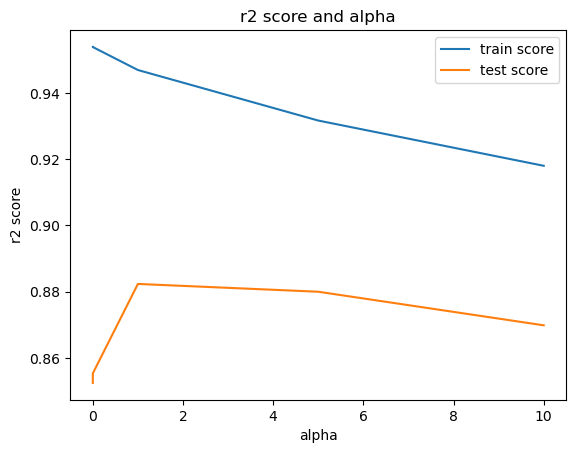

In [131]:
# plotting mean test and train scoes with alpha to tune hyper parameter
cv_results['param_alpha'] = cv_results['param_alpha'].astype('int32')

# plotting
plt.plot(cv_results['param_alpha'], cv_results['mean_train_score'])
plt.plot(cv_results['param_alpha'], cv_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('r2 score')
plt.title("r2 score and alpha")
plt.legend(['train score', 'test score'], loc='upper right')
plt.show()

In [132]:
# model with optimal alpha = 1
# ridge regression
lm = Ridge(alpha=1)
lm.fit(X_train, y_train)


# predict
y_train_pred = lm.predict(X_train)
print(metrics.r2_score(y_true=y_train, y_pred=y_train_pred))
y_test_pred = lm.predict(X_test)
print(metrics.r2_score(y_true=y_test, y_pred=y_test_pred))

0.9427440863630674
0.892735268308621


#### Insights
- with alpha 1 it has still 5 percent change

In [133]:
# model with optimal alpha = 4
# ridge regression
lm = Ridge(alpha=4)
lm.fit(X_train, y_train)

# predict
y_train_pred = lm.predict(X_train)
print(metrics.r2_score(y_true=y_train, y_pred=y_train_pred))
y_test_pred = lm.predict(X_test)
print(metrics.r2_score(y_true=y_test, y_pred=y_test_pred))

0.9328774732283216
0.8896604150718403


#### Insights
- with alpha 4 is optimal compared to other alpha value
- With optimal value of `alpha` = 4, we got following score for train and test data set.

- R2 for train : 0.9328774732283216
- R2 for test : 0.8896604150718403

**we can conclude that model is not overfitting as train and test data r2 is very less in change**

In [134]:
# lasso model parameters with alpha = 4
model_parameters = list(lm.coef_)
model_parameters.insert(0, lm.intercept_)
model_parameters = [round(x, 3) for x in model_parameters]
cols = X.columns
cols = cols.insert(0, "constant")
rid_cof = lm.coef_
ridge_cofficents = list(zip(cols, model_parameters))
ridge_cofficents


[('constant', 11.352),
 ('MSSubClass', -0.036),
 ('LotArea', 0.163),
 ('MasVnrArea', 0.029),
 ('BsmtFinSF1', 0.167),
 ('BsmtFinSF2', 0.05),
 ('BsmtUnfSF', 0.084),
 ('TotalBsmtSF', 0.198),
 ('CentralAir', 0.077),
 ('1stFlrSF', 0.313),
 ('2ndFlrSF', 0.2),
 ('LowQualFinSF', 0.016),
 ('GrLivArea', 0.332),
 ('GarageArea', 0.147),
 ('WoodDeckSF', 0.057),
 ('OpenPorchSF', 0.059),
 ('EnclosedPorch', 0.008),
 ('3SsnPorch', 0.043),
 ('ScreenPorch', 0.069),
 ('PoolArea', 0.0),
 ('MiscVal', 0.0),
 ('house_age', -0.124),
 ('house_age_in_months_sold', -0.136),
 ('garage_age', -0.007),
 ('gap_between_build_remodel', 0.137),
 ('MSZoning_FV', 0.114),
 ('MSZoning_RH', 0.037),
 ('MSZoning_RL', 0.078),
 ('MSZoning_RM', 0.052),
 ('LotShape_IR2', -0.001),
 ('LotShape_IR3', -0.035),
 ('LotShape_Reg', 0.004),
 ('LandContour_HLS', 0.02),
 ('LandContour_Low', -0.09),
 ('LandContour_Lvl', -0.011),
 ('LotConfig_CulDSac', 0.036),
 ('LotConfig_FR2', -0.034),
 ('LotConfig_FR3', -0.009),
 ('LotConfig_Inside', -0.002)

##### Lets do variable selection done lasso regression

In [135]:
lasso_filtered_cols = list(filter(lambda x: x[1] != 0, lasso_cofficents))

In [136]:
len(lasso_cofficents)

215

In [137]:
len(lasso_filtered_cols)

151

#### Insights 
- out of 215 cofficents Lasso reduced it to 151 cofficents

In [138]:
output = pd.DataFrame(lasso_filtered_cols).sort_values(by=[1],ascending=False)
output.columns = ['Variable', 'Coeff']
output

,Variable,Coeff
0,constant,10.958
8,GrLivArea,0.904
18,MSZoning_FV,0.399
20,MSZoning_RL,0.305
5,TotalBsmtSF,0.292
...,...,...
25,LandContour_Low,-0.133
69,Exterior1st_BrkComm,-0.217
36,Neighborhood_MeadowV,-0.231
126,Functional_Maj2,-0.254


#### Comparing Lasso & Ridge

In [139]:
lasso_and_ridge = pd.DataFrame(index=X.columns)
lasso_and_ridge.rows = X.columns

In [140]:
lasso_and_ridge['Ridge'] = rid_cof
lasso_and_ridge['Lasso'] = lasso_cof
lasso_and_ridge

,Ridge,Lasso
MSSubClass,-0.035910,-0.034460
LotArea,0.162947,0.143533
MasVnrArea,0.029310,-0.000000
BsmtFinSF1,0.166992,0.135646
BsmtFinSF2,0.050362,0.049835
...,...,...
SaleCondition_AdjLand,0.075898,0.203830
SaleCondition_Alloca,0.036416,0.037501
SaleCondition_Family,-0.016354,-0.024550
SaleCondition_Normal,0.081929,0.089493


In [141]:
lasso_and_ridge['Lasso'].sort_values(ascending=False)[:10]

GrLivArea                    0.903794
MSZoning_FV                  0.399264
MSZoning_RL                  0.305337
TotalBsmtSF                  0.292467
Condition2_PosA              0.285193
MSZoning_RM                  0.271485
MSZoning_RH                  0.259460
gap_between_build_remodel    0.227167
SaleCondition_AdjLand        0.203830
Neighborhood_Crawfor         0.203180
Name: Lasso, dtype: float64

In [142]:
lasso_and_ridge['Ridge'].sort_values(ascending=False)[:10]

GrLivArea                    0.332195
1stFlrSF                     0.313321
2ndFlrSF                     0.200188
TotalBsmtSF                  0.198297
BsmtFinSF1                   0.166992
LotArea                      0.162947
GarageArea                   0.147398
Neighborhood_Crawfor         0.141732
gap_between_build_remodel    0.136580
MSZoning_FV                  0.113838
Name: Ridge, dtype: float64

## Conclusion

#### equation for lasso and ridge regression 
- log(y)  = 0.903794(GrLivArea)+ 0.399264(MSZoning_FV) + 0.305337(MSZoning_RL) + etcc... + 4 * sum(mod(beta))
- log(y)  = 0.332195(GrLivArea)+ 0.313321(1stFlrSF) + 0.200188(2ndFlrSF) + etcc... + 4 * sum(square(beta))

- Top five features from Lasso are `GrLivArea, MSZoning_FV, MSZoning_RL, TotalBsmtSF, Condition2_PosA` with positive coff 
- Top five features from Ridge are `GrLivArea, 1stFlrSF, 2ndFlrSF, TotalBsmtSF, BsmtFinSF1` with positve coff


### Regression Subjective Questions 

In [161]:
# doubling the value alpha value for lasso
lm = Lasso(alpha=0.0002)
lm.fit(X_train, y_train)


# predict
y_train_pred = lm.predict(X_train)
print(metrics.r2_score(y_true=y_train, y_pred=y_train_pred))
y_test_pred = lm.predict(X_test)
print(metrics.r2_score(y_true=y_test, y_pred=y_test_pred))
model_parameters = list(lm.coef_)
model_parameters.insert(0, lm.intercept_)
model_parameters = [round(x, 3) for x in model_parameters]
rid_cof = list(model_parameters)
rid_cof

0.940652649618646
0.8960908255527905


[11.098,
 -0.033,
 0.146,
 -0.0,
 0.133,
 0.038,
 -0.0,
 0.282,
 0.064,
 0.086,
 0.0,
 -0.0,
 0.901,
 0.173,
 0.06,
 0.024,
 0.01,
 0.03,
 0.082,
 0.0,
 0.0,
 -0.0,
 -0.479,
 0.023,
 0.226,
 0.301,
 0.158,
 0.216,
 0.183,
 -0.0,
 -0.05,
 0.005,
 0.008,
 -0.133,
 -0.011,
 0.028,
 -0.026,
 -0.0,
 -0.002,
 -0.003,
 0.0,
 0.06,
 -0.0,
 -0.006,
 0.195,
 -0.062,
 -0.005,
 -0.0,
 -0.189,
 -0.031,
 -0.005,
 -0.0,
 0.0,
 0.051,
 0.065,
 -0.038,
 -0.0,
 -0.0,
 -0.0,
 -0.0,
 0.115,
 0.007,
 0.051,
 0.03,
 0.04,
 0.0,
 0.0,
 -0.049,
 0.008,
 -0.0,
 0.034,
 -0.0,
 0.013,
 0.208,
 -0.0,
 -0.002,
 -0.078,
 -0.037,
 0.0,
 0.0,
 -0.027,
 -0.009,
 0.006,
 -0.0,
 -0.0,
 0.0,
 -0.004,
 0.016,
 -0.0,
 0.008,
 -0.0,
 0.0,
 -0.0,
 -0.0,
 0.0,
 -0.165,
 0.067,
 -0.0,
 0.01,
 -0.0,
 0.0,
 0.018,
 -0.017,
 0.0,
 0.048,
 -0.0,
 -0.013,
 0.0,
 0.0,
 -0.0,
 -0.0,
 -0.0,
 0.01,
 0.0,
 0.0,
 -0.0,
 0.0,
 -0.008,
 0.0,
 -0.015,
 0.001,
 0.016,
 0.0,
 0.011,
 0.0,
 0.05,
 0.0,
 -0.09,
 -0.048,
 -0.05,
 -0.034,
 -0.006

In [164]:
# doubling the value alpha value for ridge
lm = Ridge(alpha=8)
lm.fit(X_train, y_train)

# predict
y_train_pred = lm.predict(X_train)
print(metrics.r2_score(y_true=y_train, y_pred=y_train_pred))
y_test_pred = lm.predict(X_test)
print(metrics.r2_score(y_true=y_test, y_pred=y_test_pred))
model_parameters = list(lm.coef_)
model_parameters.insert(0, lm.intercept_)
model_parameters = [round(x, 3) for x in model_parameters]
lasso_cof = list(model_parameters)
lasso_cof

0.9231586617970552
0.8833853766117654


[11.423,
 -0.033,
 0.163,
 0.036,
 0.147,
 0.035,
 0.083,
 0.176,
 0.075,
 0.272,
 0.175,
 0.008,
 0.288,
 0.131,
 0.053,
 0.062,
 0.004,
 0.03,
 0.06,
 0.0,
 0.0,
 -0.089,
 -0.096,
 -0.017,
 0.105,
 0.073,
 0.014,
 0.053,
 0.021,
 0.001,
 -0.021,
 -0.0,
 0.024,
 -0.064,
 -0.005,
 0.036,
 -0.026,
 -0.006,
 -0.003,
 -0.011,
 -0.001,
 0.013,
 -0.005,
 -0.024,
 0.117,
 -0.073,
 -0.035,
 -0.056,
 -0.066,
 -0.028,
 -0.015,
 -0.005,
 0.004,
 0.045,
 0.074,
 -0.052,
 -0.019,
 -0.012,
 -0.012,
 0.032,
 0.067,
 -0.0,
 0.031,
 0.023,
 0.04,
 0.0,
 0.017,
 -0.02,
 0.005,
 -0.009,
 0.017,
 -0.004,
 0.01,
 0.04,
 -0.008,
 -0.004,
 -0.014,
 -0.035,
 -0.014,
 -0.016,
 -0.046,
 0.003,
 0.029,
 0.018,
 -0.046,
 -0.017,
 -0.036,
 0.027,
 -0.014,
 0.025,
 -0.006,
 -0.007,
 -0.005,
 -0.009,
 0.0,
 -0.043,
 0.065,
 -0.022,
 0.024,
 -0.001,
 0.007,
 0.002,
 -0.005,
 0.0,
 0.031,
 -0.022,
 -0.034,
 -0.013,
 -0.005,
 -0.043,
 0.006,
 -0.022,
 0.024,
 -0.001,
 0.002,
 0.006,
 0.0,
 0.004,
 -0.003,
 -0.026,
 0.

In [165]:
cols = X.columns
cols = cols.insert(0, "constant")
lasso_and_ridge_double = pd.DataFrame(index=cols)
lasso_and_ridge_double.rows = cols

lasso_and_ridge_double['Ridge'] = rid_cof
lasso_and_ridge_double['Lasso'] = lasso_cof
lasso_and_ridge_double

,Ridge,Lasso
constant,11.098,11.423
MSSubClass,-0.033,-0.033
LotArea,0.146,0.163
MasVnrArea,-0.000,0.036
BsmtFinSF1,0.133,0.147
...,...,...
SaleCondition_AdjLand,0.155,0.042
SaleCondition_Alloca,0.017,0.027
SaleCondition_Family,-0.014,-0.012
SaleCondition_Normal,0.090,0.073


In [166]:
lasso_and_ridge_double['Lasso'].sort_values(ascending=False)[:10]

constant                     11.423
GrLivArea                     0.288
1stFlrSF                      0.272
TotalBsmtSF                   0.176
2ndFlrSF                      0.175
LotArea                       0.163
BsmtFinSF1                    0.147
GarageArea                    0.131
Neighborhood_Crawfor          0.117
gap_between_build_remodel     0.105
Name: Lasso, dtype: float64

In [167]:
lasso_and_ridge_double['Ridge'].sort_values(ascending=False)[:10]

constant                     11.098
GrLivArea                     0.901
MSZoning_FV                   0.301
TotalBsmtSF                   0.282
gap_between_build_remodel     0.226
MSZoning_RL                   0.216
Condition2_PosA               0.208
Neighborhood_Crawfor          0.195
MSZoning_RM                   0.183
GarageArea                    0.173
Name: Ridge, dtype: float64